In [1]:
import os
import re
from pathlib import Path

import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!ls /Volumes/timmy/ding/spatial/processed_data/

BRCA_206B1         Colorectal_112C1_1 Colorectal_112C1_2 Samplemap.csv


In [3]:
results_dir = '../results/BRCA_206B1'
Path(results_dir).mkdir(parents=True, exist_ok=True)
sc.settings.figdir = os.path.join(results_dir, 'figures')

In [4]:
adata = sc.read_visium('/Volumes/timmy/ding/spatial/processed_data/BRCA_206B1/')
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
adata

AnnData object with n_obs × n_vars = 3586 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
AAACAAGTATCTCCCA-1,1,50,102,778,6.658011,1195.0,7.086738,26.276151,37.405858,51.631799,76.736402,55.0,4.025352,4.602510
AAACACCAATAACTGC-1,1,59,19,6244,8.739536,24709.0,10.114964,22.210531,32.453762,42.733417,55.259217,952.0,6.859615,3.852847
AAACAGAGCGACTCCT-1,1,14,94,1020,6.928538,1842.0,7.519150,30.076004,40.988056,53.203040,71.769815,143.0,4.969813,7.763301
AAACAGCTTTCAGAAG-1,1,43,9,9217,9.128913,49222.0,10.804116,20.421763,30.098330,39.266994,50.377880,1578.0,7.364547,3.205884
AAACAGGGTCTATATT-1,1,47,13,393,5.976351,566.0,6.340359,33.922261,48.233216,65.901060,100.000000,15.0,2.772589,2.650177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCTAGATACGCT-1,1,21,3,3014,8.011355,7402.0,8.909640,24.061065,34.369089,44.839233,58.943529,488.0,6.192362,6.592813
TTGTTGGCAATGACTG-1,1,76,30,2301,7.741534,5142.0,8.545392,24.173473,35.083625,45.838195,61.026838,180.0,5.198497,3.500583
TTGTTTCCATACAACT-1,1,45,27,978,6.886532,1730.0,7.456455,29.653179,40.462428,53.063584,72.369942,100.0,4.615120,5.780347
TTGTTTGTATTACACG-1,1,73,41,3347,8.116118,8282.0,9.021960,22.422120,32.274813,42.477662,56.906544,222.0,5.407172,2.680512


/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displ

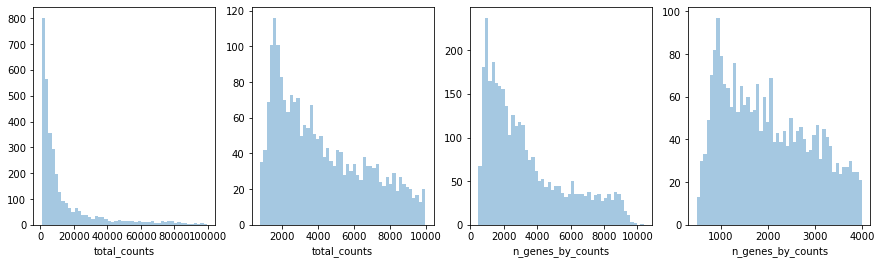

In [31]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
bins = 50
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0], bins=bins)
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=bins, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=bins, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=bins, ax=axs[3])
plt.savefig(os.path.join(results_dir, 'figures', 'qc_metrics.png'))

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


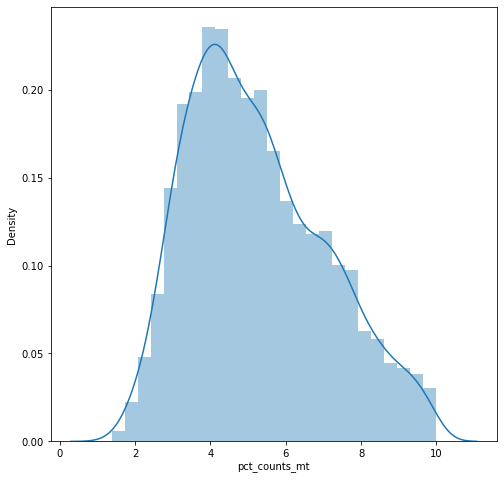

In [32]:
sns.distplot(adata.obs['pct_counts_mt'])
plt.savefig(os.path.join(results_dir, 'figures', 'qc_metrics_pct_mt.png'))

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


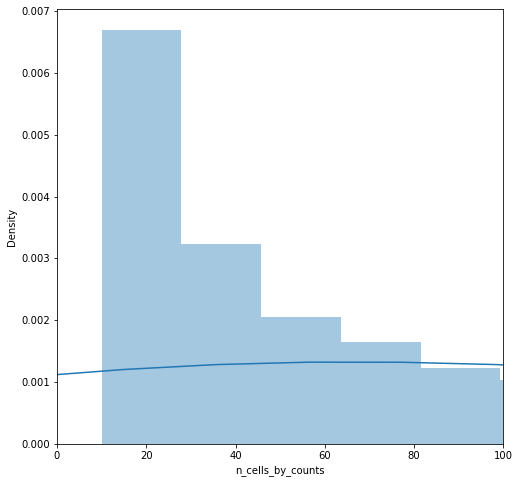

In [33]:
sns.distplot(adata.var['n_cells_by_counts'], bins=200)
plt.xlim((0, 100))
plt.savefig(os.path.join(results_dir, 'figures', 'qc_metrics_ncells.png'))

In [10]:
sc.pp.filter_cells(adata, min_counts=750)
sc.pp.filter_cells(adata, max_counts=100000)
adata = adata[adata.obs["pct_counts_mt"] < 10]
# sc.pp.filter_cells(adata, min_counts=2000)
# sc.pp.filter_cells(adata, max_counts=50000)
# adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.var` of view, copying.


#cells after MT filter: 3330


In [11]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [12]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical
... storing 'genome' as categorical


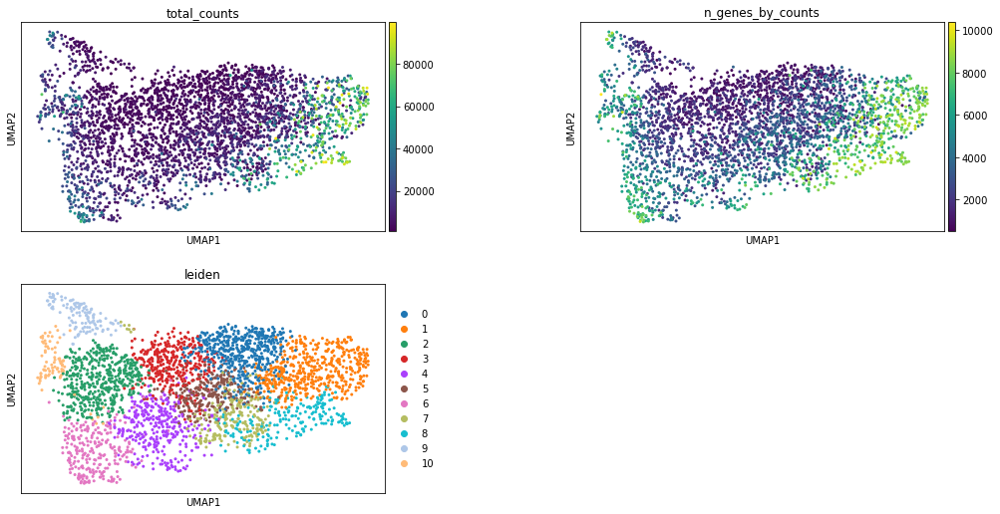

In [13]:
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "leiden"], wspace=0.4, ncols=2)

In [14]:
list(adata.uns.keys())

['spatial',
 'log1p',
 'hvg',
 'pca',
 'neighbors',
 'umap',
 'leiden',
 'leiden_colors']

In [15]:
# test = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
# test

In [16]:
# test.uns['spatial']

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


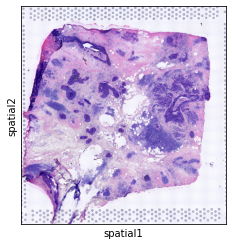

In [17]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", size=0,
             save='hires.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


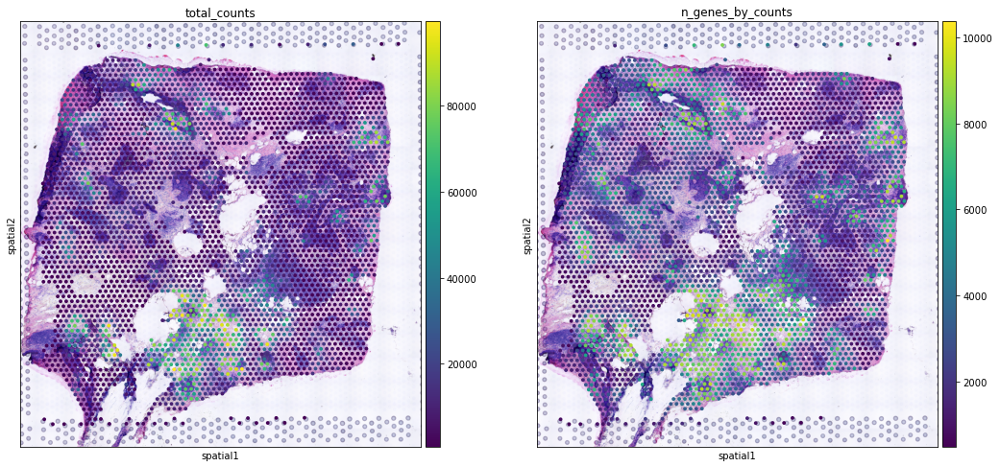

In [18]:

sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"],
             save='hires_count_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


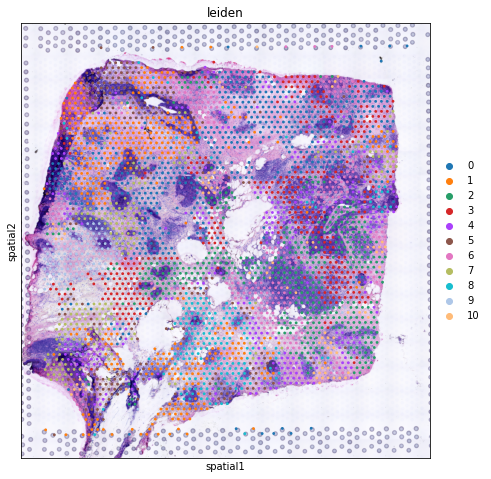

In [19]:
sc.pl.spatial(adata, img_key="hires", color="leiden", size=.75,
             save='hires_leiden_colored_small.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


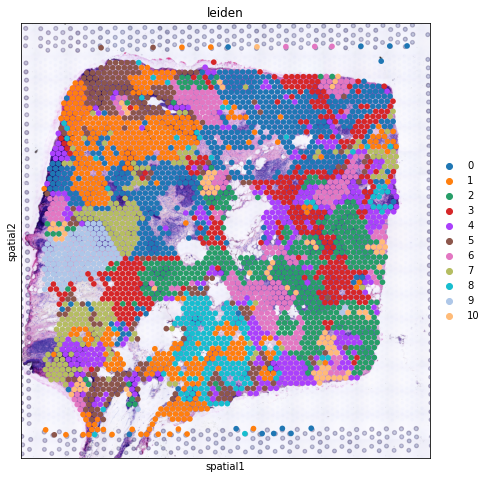

In [20]:
sc.pl.spatial(adata, img_key="hires", color="leiden", size=1.5,
             save='hires_leiden_colored_large.png')

In [21]:
adata.uns['spatial']['BRCA_206B1']['images']['hires'].shape

(2000, 1969, 3)

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


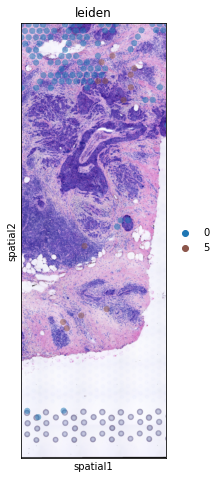

In [22]:
sc.pl.spatial(adata, img_key="hires", color="leiden", groups=["0", "5"],
              crop_coord=[1200, 1700, 1500, 0], alpha=0.5, size=1.3,)

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


categories: 0, 1, 2, etc.
var_group_labels: 0, 1


/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


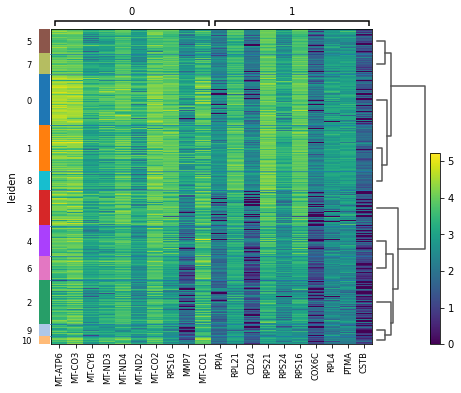

In [23]:
sc.tl.rank_genes_groups(adata, "leiden", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groups=['0', '1'], groupby="leiden")

categories: 0, 1, 2, etc.
var_group_labels: 1


/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


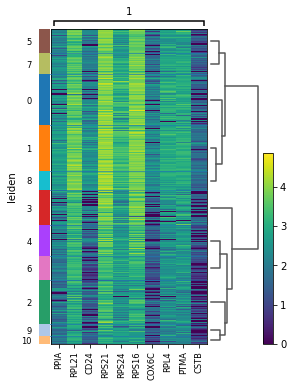

In [24]:

sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groups=['1'], groupby="leiden")

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


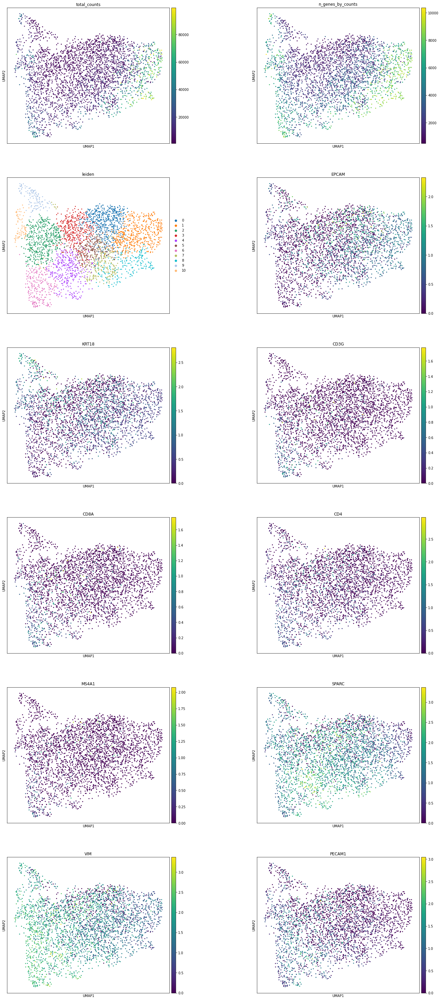

In [25]:
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "leiden", 'EPCAM', 'KRT18', 'CD3G', 'CD8A',
                         'CD4', 'MS4A1',
                        'SPARC', 'VIM', 'PECAM1'],
           wspace=0.4, ncols=2, save='_umap_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


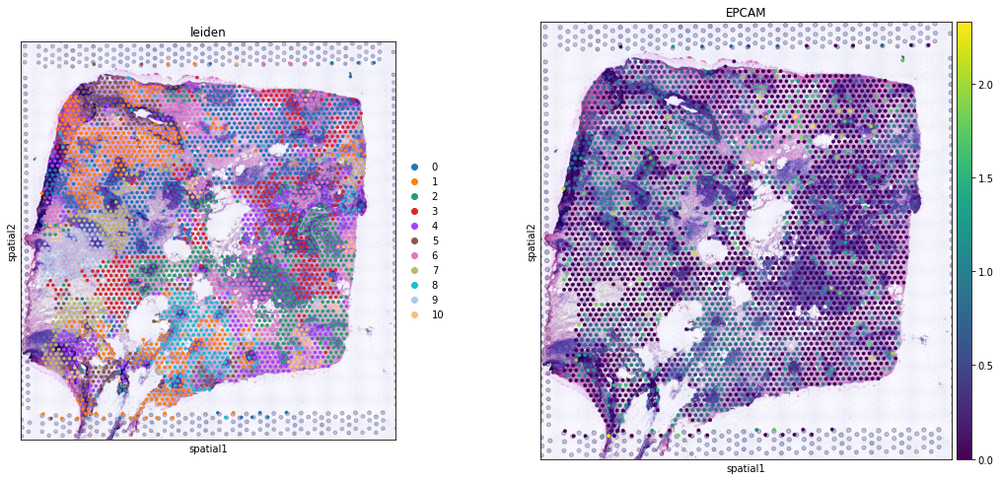

In [26]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", "EPCAM"],
             save='hires_leiden_epcam_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


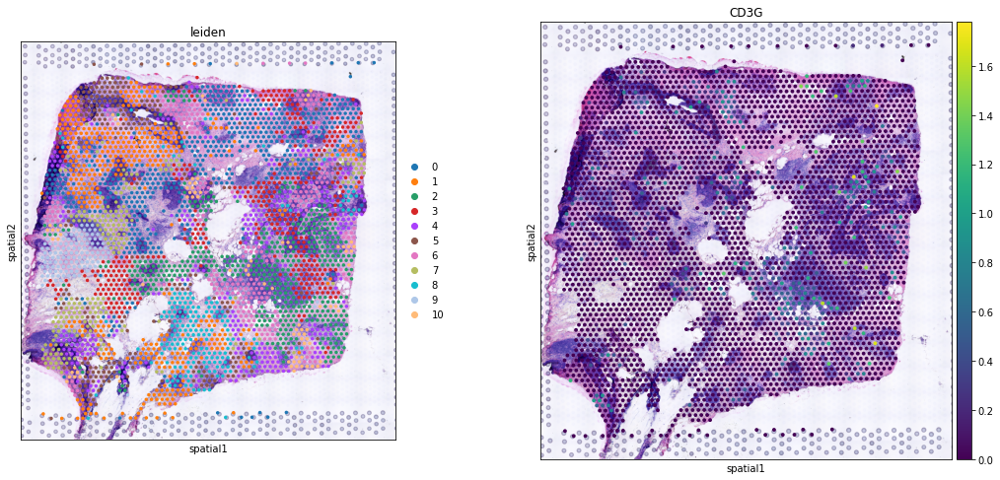

In [27]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", "CD3G"],
             save='hires_leiden_cd3g_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


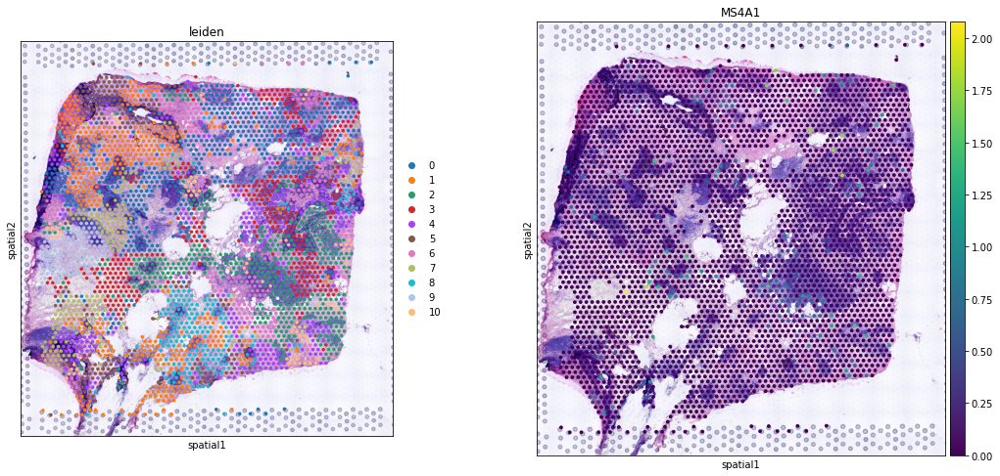

In [28]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", "MS4A1"],
             save='hires_leiden_ms4a1_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


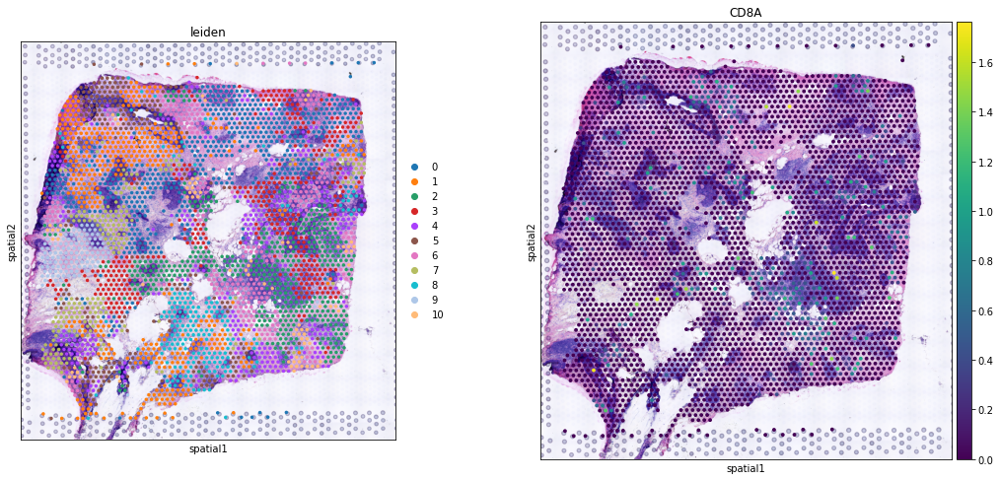

In [29]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", "CD8A"],
             save='hires_leiden_cd8a_colored.png')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


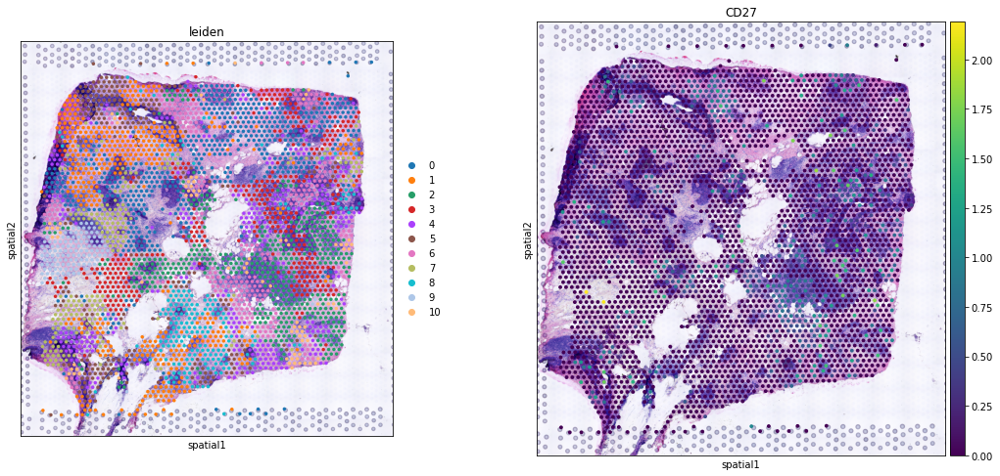

In [30]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", 'CD27'],
             save='hires_leiden_cd27_colored.png')

In [34]:
results_dir

'./results/BRCA_206B1'